In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import os

In [2]:
os.chdir('C:/Users/Evangelina Garza/Documents/CIMAT/MCE_2Semestre/Ciencia de Datos/Tarea5')

In [3]:
all_tracks=pd.read_csv('my_all_tracks_2019.csv')

In [4]:
all_tracks.head()

,track_id,file,album.title,album.tracks,album.listens,album.type,artist.name,artist.latitude,artist.longitude,track.interest,...,tonnetz.std.04,tonnetz.std.05,tonnetz.std.06,zcr.kurtosis.01,zcr.max.01,zcr.mean.01,zcr.median.01,zcr.min.01,zcr.skew.01,zcr.std.01
0,2,fma_large/000/000002.mp3,AWOL - A Way Of Life,7,6073,Album,AWOL,40.058324,-74.405661,4656,...,0.054125,0.012226,0.012111,5.758890,0.459473,0.085629,0.071289,0.0,2.089872,0.061448
1,3,fma_large/000/000003.mp3,AWOL - A Way Of Life,7,6073,Album,AWOL,40.058324,-74.405661,1470,...,0.063831,0.014212,0.017740,2.824694,0.466309,0.084578,0.063965,0.0,1.716724,0.069330
2,5,fma_large/000/000005.mp3,AWOL - A Way Of Life,7,6073,Album,AWOL,40.058324,-74.405661,1933,...,0.040730,0.012691,0.014759,6.808415,0.375000,0.053114,0.041504,0.0,2.193303,0.044861
3,10,fma_large/000/000010.mp3,Constant Hitmaker,2,47632,Album,Kurt Vile,NaN,NaN,54881,...,0.074358,0.017952,0.013921,21.434212,0.452148,0.077515,0.071777,0.0,3.542325,0.040800
4,134,fma_large/000/000134.mp3,AWOL - A Way Of Life,7,6073,Album,AWOL,40.058324,-74.405661,1126,...,0.058766,0.016322,0.015819,4.731087,0.419434,0.064370,0.050781,0.0,1.806106,0.054623


In [5]:
all_tracks.shape

(13129, 549)

In [6]:
all_tracks.columns

Index(['track_id', 'file', 'album.title', 'album.tracks', 'album.listens',
       'album.type', 'artist.name', 'artist.latitude', 'artist.longitude',
       'track.interest',
       ...
       'tonnetz.std.04', 'tonnetz.std.05', 'tonnetz.std.06', 'zcr.kurtosis.01',
       'zcr.max.01', 'zcr.mean.01', 'zcr.median.01', 'zcr.min.01',
       'zcr.skew.01', 'zcr.std.01'],
      dtype='object', length=549)

In [7]:
car_tracks=all_tracks.iloc[:,:22]

In [8]:
car_tracks.shape

(13129, 22)

In [9]:
car_tracks.columns

Index(['track_id', 'file', 'album.title', 'album.tracks', 'album.listens',
       'album.type', 'artist.name', 'artist.latitude', 'artist.longitude',
       'track.interest', 'track.duration', 'track.language_code',
       'track.genre_top', 'track.genre1', 'track.genre2',
       'metadata.artist_latitude', 'metadata.artist_longitude',
       'metadata.artist_location', 'social_features.artist_discovery',
       'social_features.artist_familiarity',
       'social_features.artist_hotttnesss', 'social_features.song_currency'],
      dtype='object')

In [10]:
genres=car_tracks['track.genre1'].value_counts()
genres

Rock                   4500
Electronic             2720
Pop                    1382
Folk                    958
Hip-Hop                 911
International           830
Jazz                    505
Old-Time / Historic     404
Classical               400
Blues                   205
Country                 130
Instrumental             84
Experimental             43
Easy Listening           30
Soul-RnB                 27
Name: track.genre1, dtype: int64

In [11]:
genres.index

Index(['Rock', 'Electronic', 'Pop', 'Folk', 'Hip-Hop', 'International', 'Jazz',
       'Old-Time / Historic', 'Classical', 'Blues', 'Country', 'Instrumental',
       'Experimental', 'Easy Listening', 'Soul-RnB'],
      dtype='object')

In [12]:
n=all_tracks.shape[0]

In [13]:
genero=[]
for i in range(n):
    for j in range(15):
        if car_tracks['track.genre1'][i]==genres.index[j]:
            genero.append(j)

In [14]:
type(genero)

list

In [15]:
car_audio=all_tracks.iloc[:,23:30]

In [16]:
car_signal=all_tracks.iloc[:,31:]

# Análisis PCA

## Variables numéricas Tracks

In [17]:
num_tracks=car_tracks.select_dtypes(include=np.number)

In [18]:
num_tracks.head()

,track_id,album.tracks,album.listens,artist.latitude,artist.longitude,track.interest,track.duration,metadata.artist_latitude,metadata.artist_longitude,social_features.artist_discovery,social_features.artist_familiarity,social_features.artist_hotttnesss,social_features.song_currency
0,2,7,6073,40.058324,-74.405661,4656,168,32.6783,-83.2230,0.388990,0.386740,0.406370,0.000000
1,3,7,6073,40.058324,-74.405661,1470,237,32.6783,-83.2230,0.388990,0.386740,0.406370,0.000000
2,5,7,6073,40.058324,-74.405661,1933,206,32.6783,-83.2230,0.388990,0.386740,0.406370,0.000000
3,10,2,47632,NaN,NaN,54881,161,39.9523,-75.1624,0.557339,0.614272,0.798387,0.005158
4,134,7,6073,40.058324,-74.405661,1126,207,32.6783,-83.2230,0.388990,0.386740,0.406370,0.000000


Text(0.5, 1.05, 'Correlation Matrix')

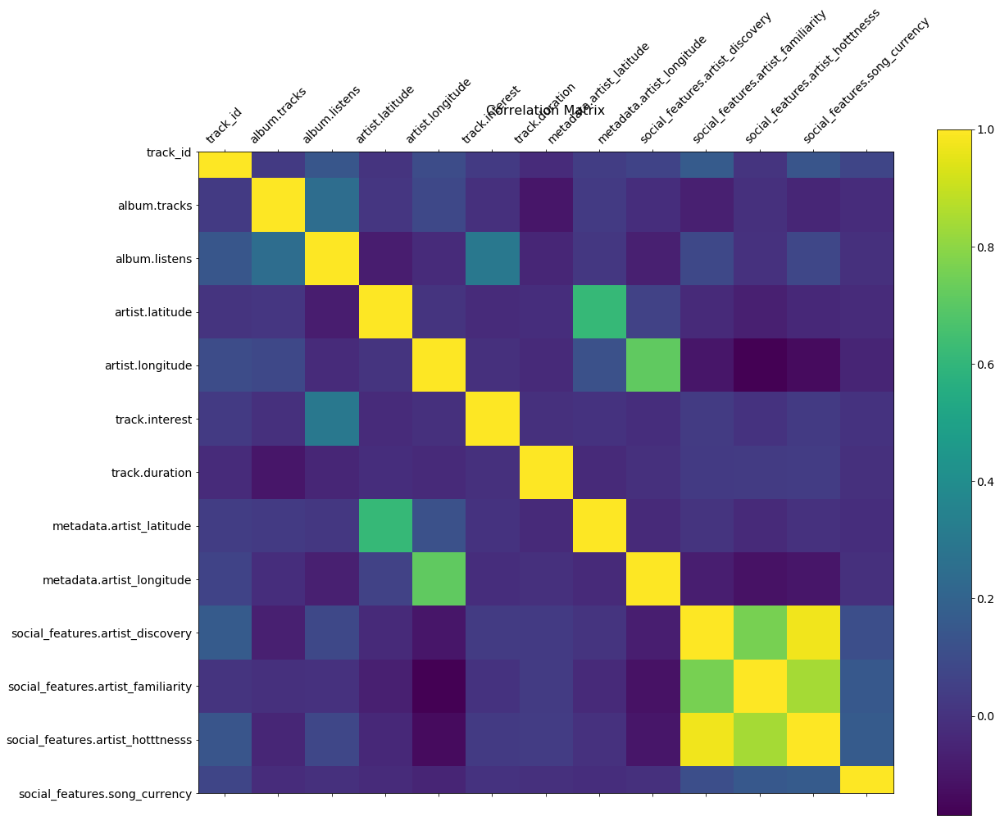

In [19]:
f = plt.figure(figsize=(19, 15))
plt.matshow(num_tracks.corr(), fignum=f.number)
plt.xticks(range(num_tracks.shape[1]), num_tracks.columns, fontsize=14, rotation=45)
plt.yticks(range(num_tracks.shape[1]), num_tracks.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)

In [20]:
genero=pd.Series(genero)

In [21]:
num_tracks_gen=num_tracks.copy()

In [22]:
num_tracks_gen['genero']=genero

In [23]:
X_tracks=num_tracks.dropna()
num_tracks_gen=num_tracks_gen.dropna()

In [24]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [25]:
X = StandardScaler().fit_transform(X_tracks)
pca = PCA(3)
pca.fit(X)
proj = pd.DataFrame(pca.transform(X),columns = ['pc1','pc2','pc3'])

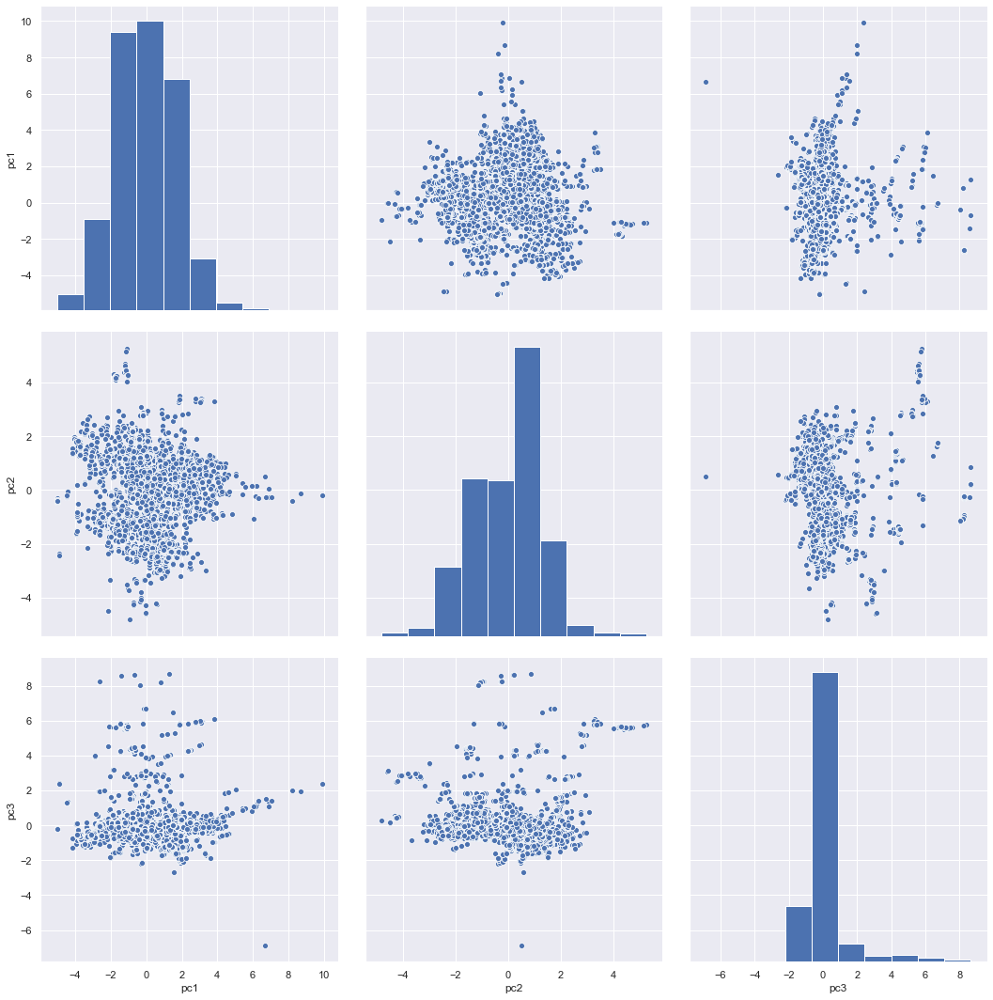

In [26]:
sns.set()
sns.pairplot(proj, height=5)

In [27]:
c_map = {0:'hotpink' , 1: 'turquoise', 2: 'orange',
         3: 'red', 4:'green', 5: 'mediumpurple',
         6: 'deeppink', 7:'cadetblue' , 8: 'limegreen', 9: 'aquamarine',
         10:'lightcoral',11:'teal',12:'coral',
         13:'lightskyblue',14:'cornflowerblue',15:'salmon',
        16:'darkorchid',17:'magenta',18:'yellowgreen',19:'rosybrown',20:'crimson'}

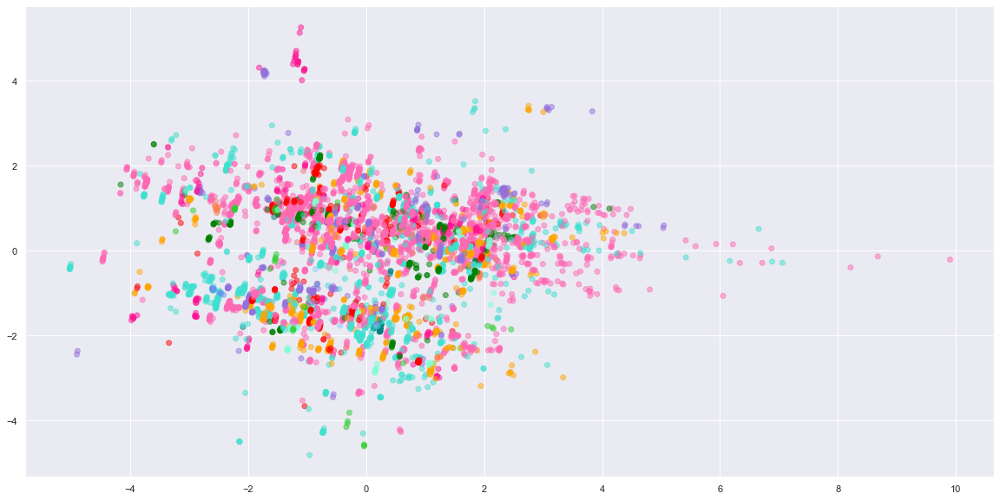

In [28]:
plt.figure(figsize=(20,10))
plt.scatter(proj['pc1'], proj['pc2'],c=[c_map[i] for i in num_tracks_gen['genero']], alpha=0.5)
plt.show()

## Variables numericas Audio

In [29]:
num_audio=car_audio.select_dtypes(include=np.number)

Text(0.5, 1.05, 'Correlation Matrix')

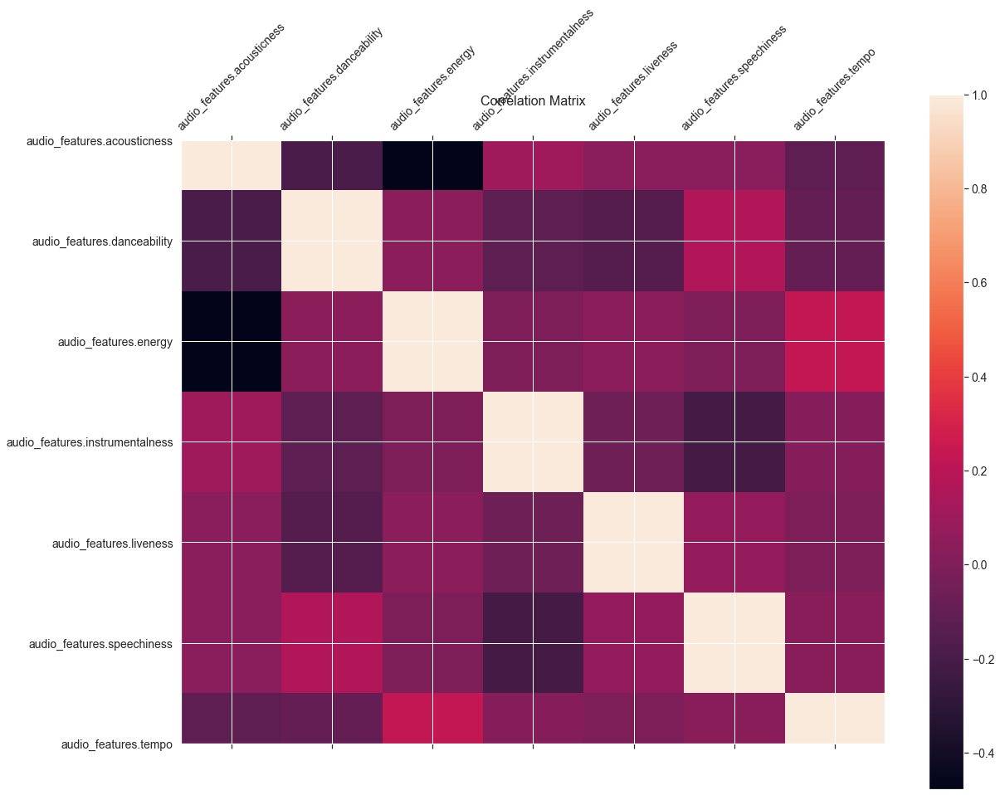

In [30]:
f = plt.figure(figsize=(19, 15))
plt.matshow(num_audio.corr(), fignum=f.number)
plt.xticks(range(num_audio.shape[1]), num_audio.columns, fontsize=14, rotation=45)
plt.yticks(range(num_audio.shape[1]), num_audio.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)

In [31]:
num_audio_gen=num_audio.copy()

In [32]:
num_audio_gen['genero']=genero

In [33]:
X_audio=num_audio.dropna()
num_audio_gen=num_audio_gen.dropna()

In [34]:
X2 = StandardScaler().fit_transform(X_audio)
pca = PCA(3)
pca.fit(X2)
proj_audio = pd.DataFrame(pca.transform(X2),columns = ['pc1','pc2','pc3'])

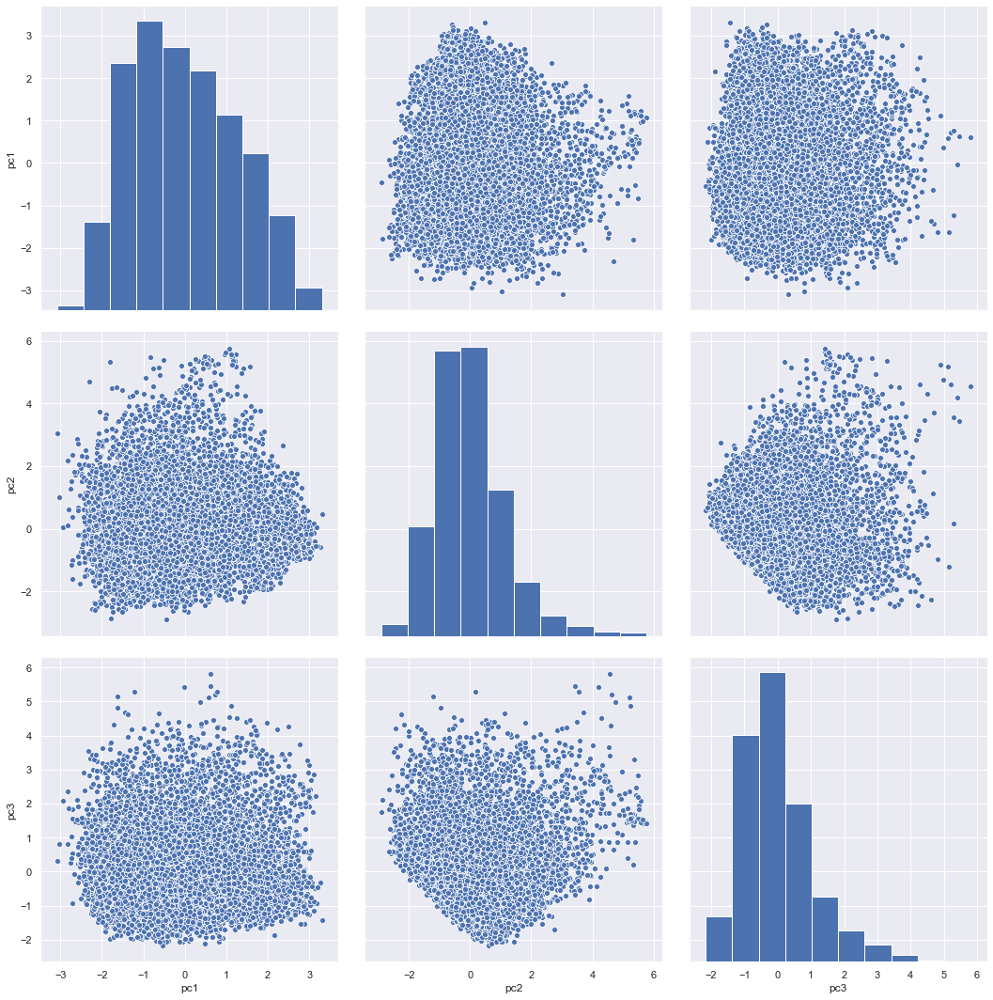

In [35]:
sns.set()
sns.pairplot(proj_audio, height=5)

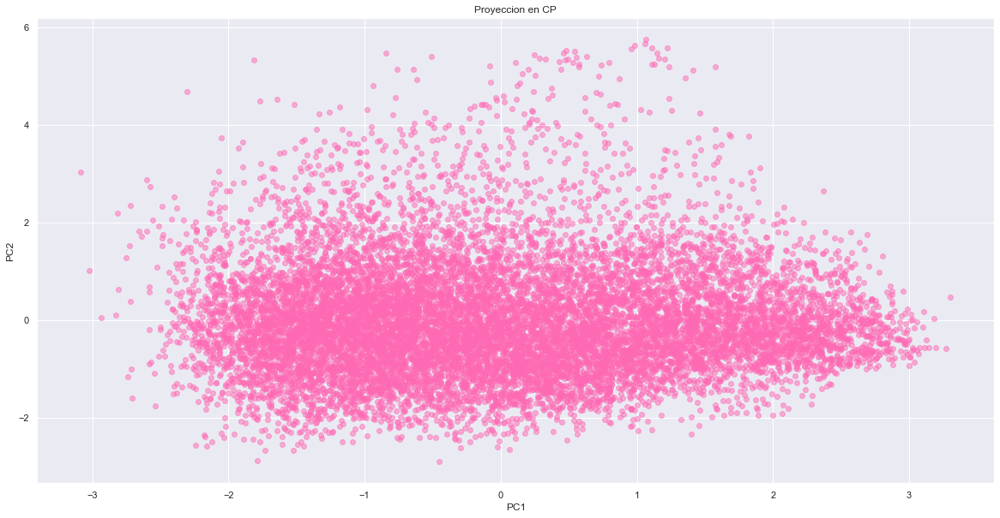

In [36]:
plt.figure(figsize=(20,10))
plt.scatter(proj_audio['pc1'], proj_audio['pc2'],c='hotpink', alpha=0.5)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Proyeccion en CP')
plt.show()

In [37]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=15, random_state=0).fit(proj_audio)
kmeans.labels_

array([1, 7, 3, ..., 2, 6, 8])

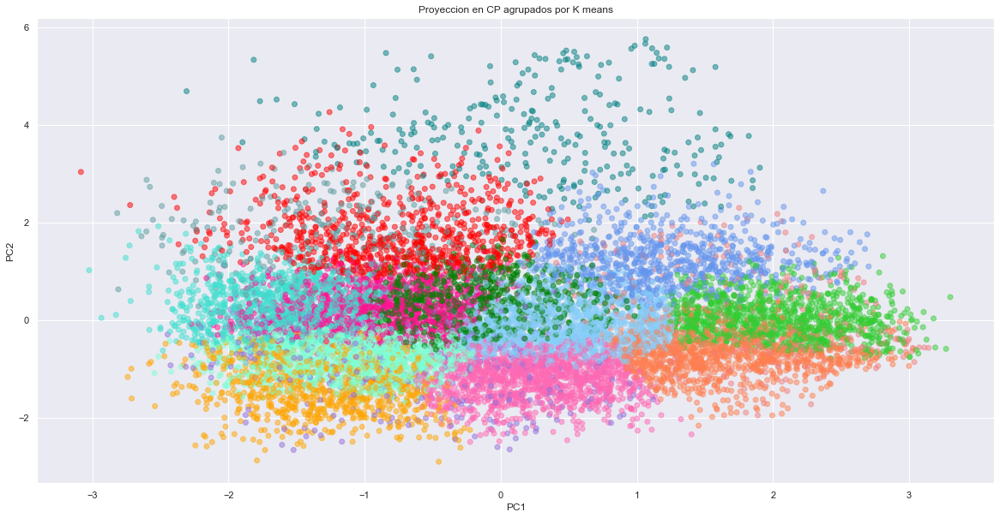

In [38]:
plt.figure(figsize=(20,10))
plt.scatter(proj_audio['pc1'], proj_audio['pc2'],c=[c_map[i] for i in kmeans.labels_], alpha=0.5)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('Proyeccion en CP agrupados por K means')
plt.show()

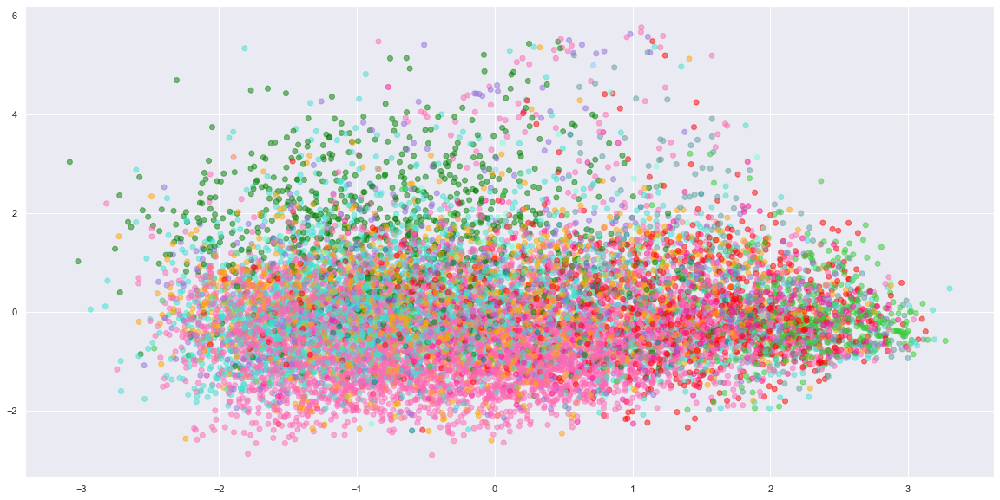

In [39]:
plt.figure(figsize=(20,10))
plt.scatter(proj_audio['pc1'], proj_audio['pc2'],c=[c_map[i] for i in num_audio_gen['genero']], alpha=0.5)
plt.show()

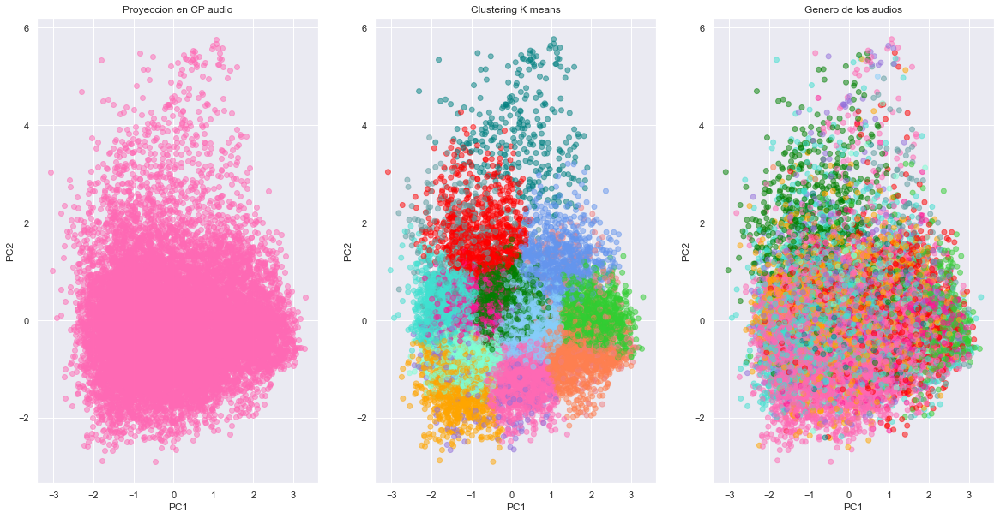

In [40]:
f, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3,figsize=(20,10))

l1=ax1.scatter(proj_audio['pc1'], proj_audio['pc2'],c='hotpink', alpha=0.5)
l2=ax2.scatter(proj_audio['pc1'], proj_audio['pc2'],c=[c_map[i] for i in kmeans.labels_], alpha=0.5)
l3=ax3.scatter(proj_audio['pc1'], proj_audio['pc2'],c=[c_map[i] for i in num_audio_gen['genero']], alpha=0.5)
ax1.set_title('Proyeccion en CP audio')
ax2.set_title('Clustering K means')
ax3.set_title('Genero de los audios')
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC2')
ax3.set_xlabel('PC1')
ax3.set_ylabel('PC2')
plt.show()

In [41]:
from sklearn.cluster import SpectralClustering

clustering = SpectralClustering(n_clusters=15).fit(proj_audio)

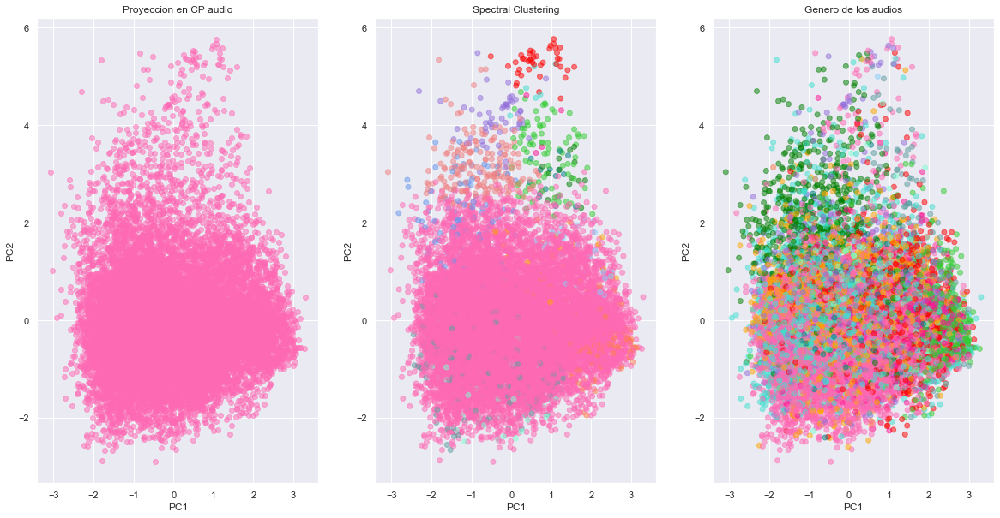

In [42]:
f, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3,figsize=(20,10))

l1=ax1.scatter(proj_audio['pc1'], proj_audio['pc2'],c='hotpink', alpha=0.5)
l2=ax2.scatter(proj_audio['pc1'], proj_audio['pc2'],c=[c_map[i] for i in clustering.labels_], alpha=0.5)
l3=ax3.scatter(proj_audio['pc1'], proj_audio['pc2'],c=[c_map[i] for i in num_audio_gen['genero']], alpha=0.5)
ax1.set_title('Proyeccion en CP audio')
ax2.set_title('Spectral Clustering')
ax3.set_title('Genero de los audios')
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC2')
ax3.set_xlabel('PC1')
ax3.set_ylabel('PC2')
plt.show()

## Análisis Kernel PCA (audio)

In [43]:
X2_audio=X_audio[0:4999]
gen2_audio=num_audio_gen['genero'][0:4999]

In [44]:
from sklearn.decomposition import KernelPCA

kpca = KernelPCA(n_components=3, kernel='cosine')
X2_kpca = kpca.fit_transform(X2_audio)

proj2_kpca = pd.DataFrame(X2_kpca,columns = ['pc1','pc2','pc3'])

C:\Anaconda3\lib\site-packages\sklearn\utils\extmath.py:516: RuntimeWarning: invalid value encountered in multiply
  v *= signs[:, np.newaxis]


In [45]:
kmeans = KMeans(n_clusters=15, random_state=0).fit(proj2_kpca)
kmeans.labels_

array([7, 7, 7, ..., 3, 4, 8])

In [46]:
clustering = SpectralClustering(n_clusters=15).fit(proj2_kpca)

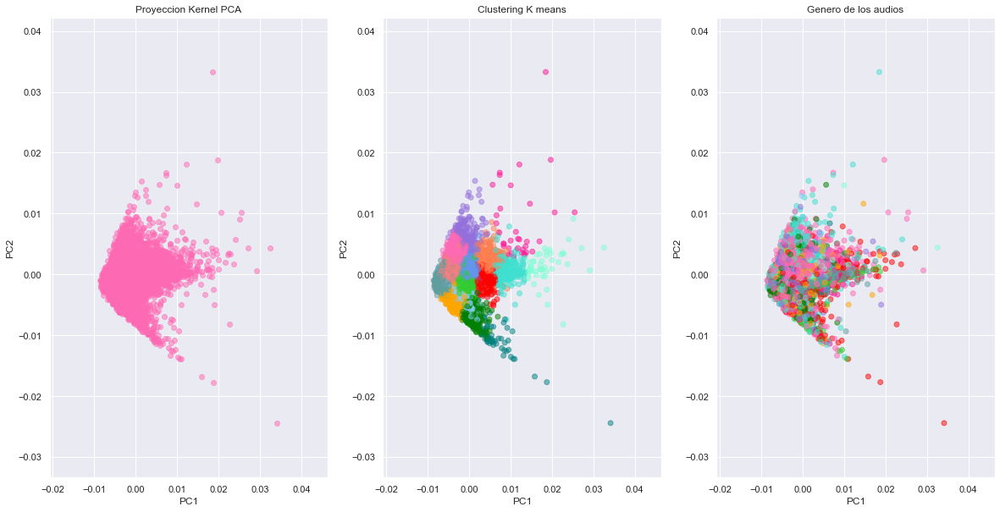

In [47]:
f, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3,figsize=(20,10))

l1=ax1.scatter(proj2_kpca['pc1'], proj2_kpca['pc2'],c='hotpink', alpha=0.5)
l2=ax2.scatter(proj2_kpca['pc1'], proj2_kpca['pc2'],c=[c_map[i] for i in kmeans.labels_], alpha=0.5)
l3=ax3.scatter(proj2_kpca['pc1'], proj2_kpca['pc2'],c=[c_map[i] for i in gen2_audio], alpha=0.5)
ax1.set_title('Proyeccion Kernel PCA')
ax2.set_title('Clustering K means')
ax3.set_title('Genero de los audios')
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC2')
ax3.set_xlabel('PC1')
ax3.set_ylabel('PC2')
plt.show()

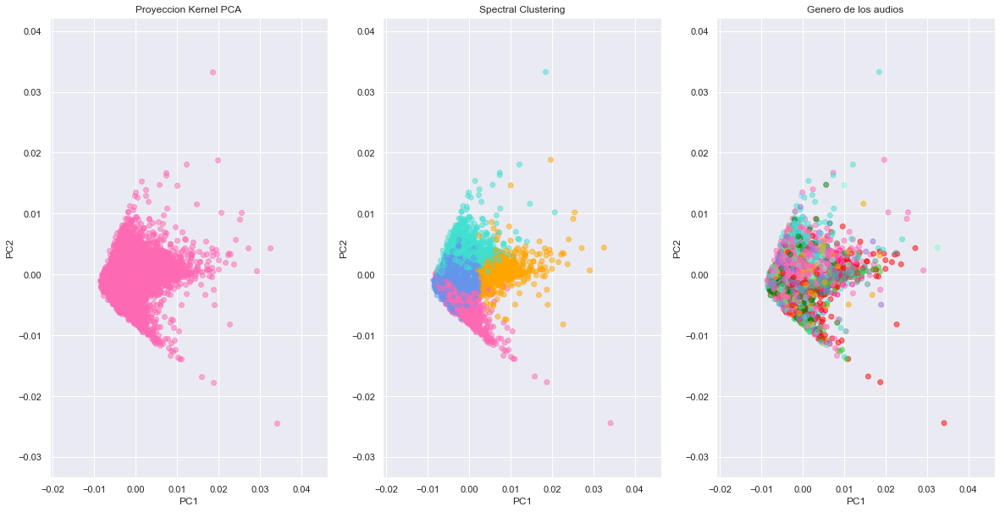

In [48]:
f, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3,figsize=(20,10))

l1=ax1.scatter(proj2_kpca['pc1'], proj2_kpca['pc2'],c='hotpink', alpha=0.5)
l2=ax2.scatter(proj2_kpca['pc1'], proj2_kpca['pc2'],c=[c_map[i] for i in clustering.labels_], alpha=0.5)
l3=ax3.scatter(proj2_kpca['pc1'], proj2_kpca['pc2'],c=[c_map[i] for i in gen2_audio], alpha=0.5)
ax1.set_title('Proyeccion Kernel PCA')
ax2.set_title('Spectral Clustering')
ax3.set_title('Genero de los audios')
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC2')
ax3.set_xlabel('PC1')
ax3.set_ylabel('PC2')
plt.show()

## Análisis TSNE

In [62]:
from sklearn.manifold import TSNE
import plotly.express as px

np.random.seed(0)
tsne = TSNE()
X_tsne = tsne.fit_transform(X_audio)

tsne_dataset = pd.DataFrame({'pc1': X_tsne[:, 0], 'pc2': X_tsne[:, 1], 'genero': num_audio_gen['genero']})

fig = px.scatter(tsne_dataset, x='pc1', y='pc2', color='genero', hover_data=['genero'])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

## Variables numéricas señales

In [49]:
num_signal=car_signal.select_dtypes(include=np.number)

In [50]:
num_signal_gen=num_signal.copy()

In [51]:
num_signal_gen['genero']=genero

In [52]:
num_signal_gen=num_signal.copy()

In [53]:
num_signal_gen['genero']=genero

In [54]:
X_signal=num_signal.dropna()
num_signal_gen=num_signal_gen.dropna()

In [55]:
X3 = StandardScaler().fit_transform(X_signal)
pca = PCA(25)
pca.fit(X3)

PCA(copy=True, iterated_power='auto', n_components=25, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [56]:
X_signal_proj=pca.transform(X3)

In [57]:
proj_signal = pd.DataFrame(X_signal_proj[:,0:10],columns = ['pc1','pc2','pc3','pc4','pc5','pc6','pc7','pc8','pc9','pc10'])

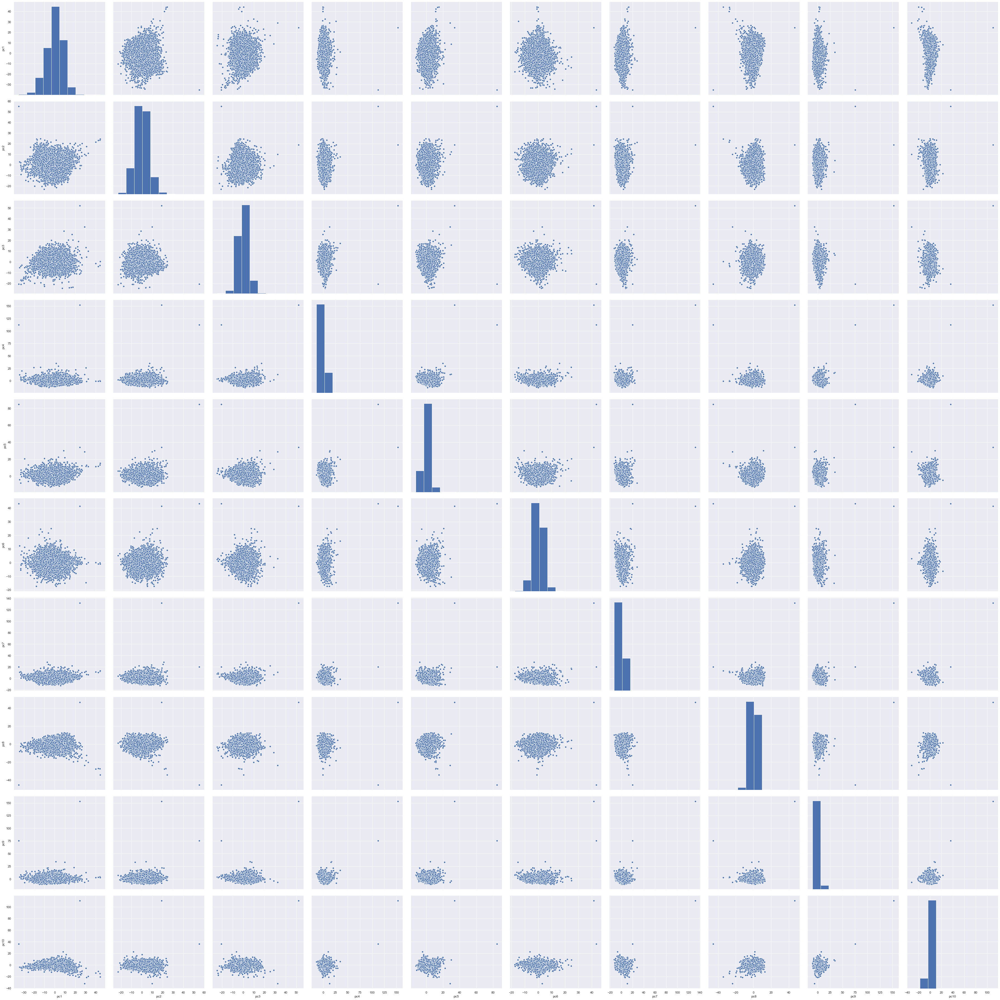

In [58]:
sns.set()
sns.pairplot(proj_signal, height=5)

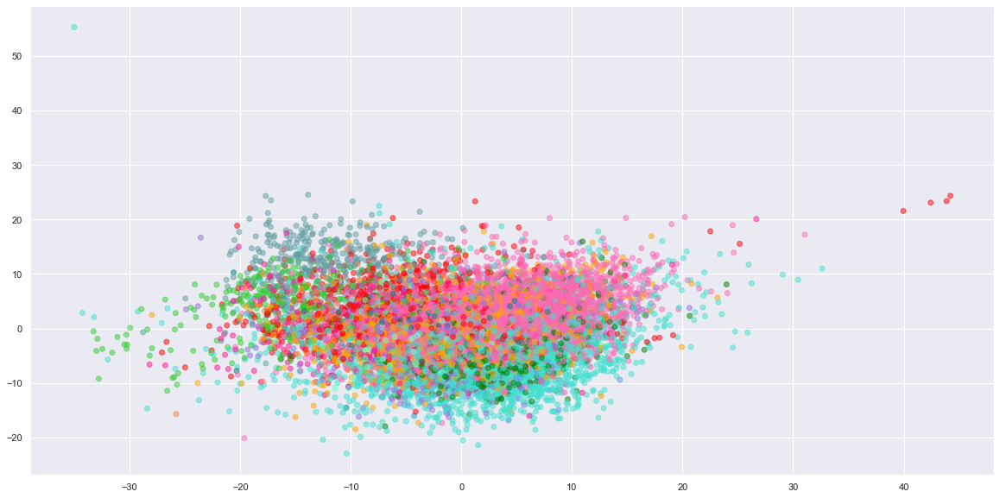

In [59]:
plt.figure(figsize=(20,10))
plt.scatter(proj_signal['pc1'], proj_signal['pc2'],c=[c_map[i] for i in num_signal_gen['genero']], alpha=0.5)
plt.show()

In [60]:
num_signal.shape

(13129, 518)

# Análisis a partir de la matriz de disimilaridades

In [66]:
from sklearn.metrics.pairwise import cosine_similarity

In [67]:
x1a=X_audio[10000::]

In [68]:
D_audio=cosine_similarity(x1a)

In [69]:
Da_tsne = tsne.fit_transform(D_audio)

tsne_audio_dataset = pd.DataFrame({'pc1': Da_tsne[:, 0], 'pc2': Da_tsne[:, 1], 'genero': num_audio_gen['genero'][10000::]})

fig = px.scatter(tsne_audio_dataset, x='pc1', y='pc2', color='genero', hover_data=['genero'])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

## Variables seleccionadas

In [70]:
car_tracks.columns

Index(['track_id', 'file', 'album.title', 'album.tracks', 'album.listens',
       'album.type', 'artist.name', 'artist.latitude', 'artist.longitude',
       'track.interest', 'track.duration', 'track.language_code',
       'track.genre_top', 'track.genre1', 'track.genre2',
       'metadata.artist_latitude', 'metadata.artist_longitude',
       'metadata.artist_location', 'social_features.artist_discovery',
       'social_features.artist_familiarity',
       'social_features.artist_hotttnesss', 'social_features.song_currency'],
      dtype='object')

In [71]:
car_audio.columns

Index(['audio_features.acousticness', 'audio_features.danceability',
       'audio_features.energy', 'audio_features.instrumentalness',
       'audio_features.liveness', 'audio_features.speechiness',
       'audio_features.tempo'],
      dtype='object')

In [72]:
car_signal.columns

Index(['chromacens.kurtosis.01', 'chromacens.kurtosis.02',
       'chromacens.kurtosis.03', 'chromacens.kurtosis.04',
       'chromacens.kurtosis.05', 'chromacens.kurtosis.06',
       'chromacens.kurtosis.07', 'chromacens.kurtosis.08',
       'chromacens.kurtosis.09', 'chromacens.kurtosis.10',
       ...
       'tonnetz.std.04', 'tonnetz.std.05', 'tonnetz.std.06', 'zcr.kurtosis.01',
       'zcr.max.01', 'zcr.mean.01', 'zcr.median.01', 'zcr.min.01',
       'zcr.skew.01', 'zcr.std.01'],
      dtype='object', length=518)

In [73]:
car_sel=pd.DataFrame({'duration': all_tracks['track.duration'],
                      'familiarity': all_tracks['social_features.artist_familiarity'],
                     'hotness': all_tracks['social_features.artist_hotttnesss'],
                      'energy': all_tracks['audio_features.energy'],
                     'danceability': all_tracks['audio_features.danceability'],
                     'instrumental': all_tracks['audio_features.instrumentalness'],
                     'tempo': all_tracks['audio_features.tempo']})

In [74]:
X_sel=car_sel.dropna()

In [75]:
X_sel.shape

(13129, 7)

In [76]:
XS = StandardScaler().fit_transform(X_sel)
pca = PCA(2)
pca.fit(XS)
proj_sel = pd.DataFrame(pca.transform(XS),columns = ['pc1','pc2'])

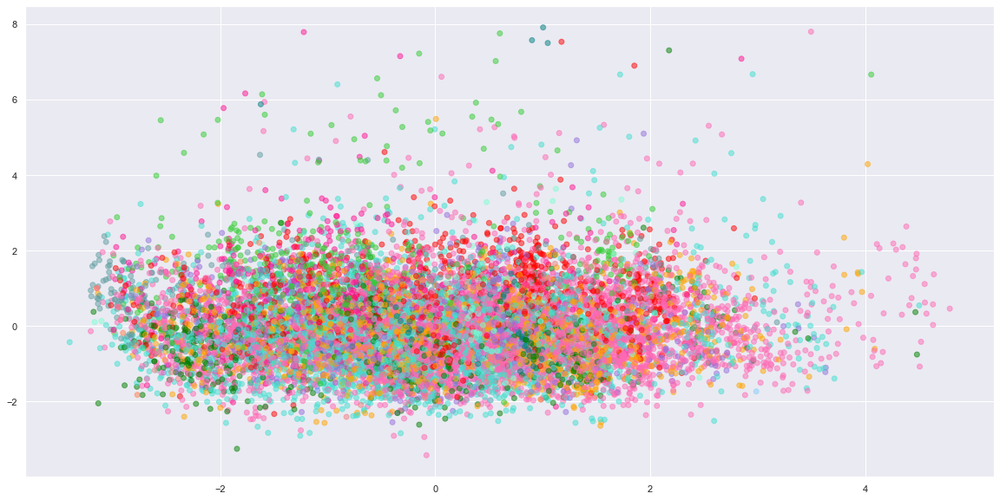

In [77]:
plt.figure(figsize=(20,10))
plt.scatter(proj_sel['pc1'], proj_sel['pc2'],c=[c_map[i] for i in genero], alpha=0.5)
plt.show()

In [79]:
Dsel_tsne = tsne.fit_transform(X_sel)

tsne_sel_dataset = pd.DataFrame({'pc1': Dsel_tsne[:, 0], 'pc2': Dsel_tsne[:, 1], 'genero': genero})

fig = px.scatter(tsne_sel_dataset, x='pc1', y='pc2', color='genero', hover_data=['genero'])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

## Análisis con unicamente algunas pistas(tracks)

In [80]:
car_audio

,audio_features.acousticness,audio_features.danceability,audio_features.energy,audio_features.instrumentalness,audio_features.liveness,audio_features.speechiness,audio_features.tempo
0,0.416675,0.675894,0.634476,0.010628,0.177647,0.159310,165.922
1,0.374408,0.528643,0.817461,0.001851,0.105880,0.461818,126.957
2,0.043567,0.745566,0.701470,0.000697,0.373143,0.124595,100.260
3,0.951670,0.658179,0.924525,0.965427,0.115474,0.032985,111.562
4,0.452217,0.513238,0.560410,0.019443,0.096567,0.525519,114.290
...,...,...,...,...,...,...,...
13124,0.007592,0.790364,0.719288,0.853114,0.720715,0.082550,141.332
13125,0.041498,0.843077,0.536496,0.865151,0.547949,0.074001,101.975
13126,0.000124,0.609686,0.895136,0.846624,0.632903,0.051517,129.996
13127,0.327576,0.574426,0.548327,0.452867,0.075928,0.033388,142.009


In [81]:
genero=all_tracks['track.genre1']

In [82]:
index=[]
for i in range(all_tracks.shape[0]):
    if genero[i]=='Pop' or genero[i]=='Folk' or genero[i]=='Hip-Hop' or genero[i]=='International' or genero[i]=='Jazz':
        index.append(i)

In [83]:
generos={0:'Pop',1:'Folk',2:'Hip-Hop',3:'International',4:'Jazz'}

In [84]:
'Rock'==generos[0]

False

In [85]:
len(index)

4586

In [86]:
np_audio=car_audio.to_numpy()

In [87]:
np_audio.shape

(13129, 7)

In [88]:
audios=np.zeros((len(index),7))
k=0
genero_audio=[]
for i in range(np_audio.shape[0]):
    for j in range(len(index)):
        if i == index[j]:
            audios[k,:]=np_audio[i,:]
            genero_audio.append(genero[i])
            k=k+1

In [89]:
for i in range(len(genero_audio)):
    for j in range(5):
        if genero_audio[i]==generos[j]:
            genero_audio[i]=j

In [90]:
X = StandardScaler().fit_transform(audios)
pca = PCA(3)
pca.fit(X)
proj_audio = pd.DataFrame(pca.transform(X),columns = ['pc1','pc2','pc3'])

In [91]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(proj_audio)
kmeans.labels_

array([1, 3, 1, ..., 3, 1, 3])

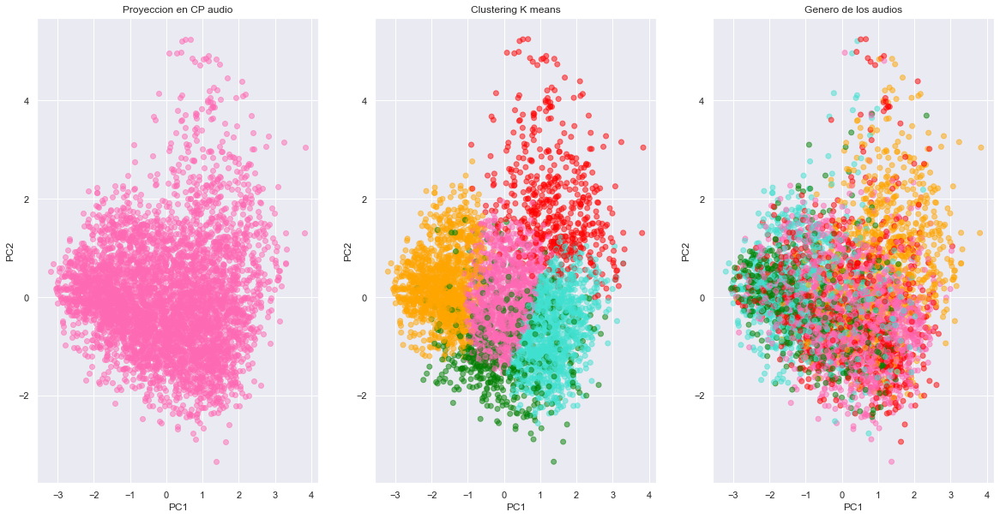

In [92]:
f, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3,figsize=(20,10))

l1=ax1.scatter(proj_audio['pc1'], proj_audio['pc2'],c='hotpink', alpha=0.5)
l2=ax2.scatter(proj_audio['pc1'], proj_audio['pc2'],c=[c_map[i] for i in kmeans.labels_], alpha=0.5)
l3=ax3.scatter(proj_audio['pc1'], proj_audio['pc2'],c=[c_map[i] for i in genero_audio], alpha=0.5)
ax1.set_title('Proyeccion en CP audio')
ax2.set_title('Clustering K means')
ax3.set_title('Genero de los audios')
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC2')
ax3.set_xlabel('PC1')
ax3.set_ylabel('PC2')
plt.show()

In [93]:
clustering = SpectralClustering(n_clusters=5).fit(proj_audio)

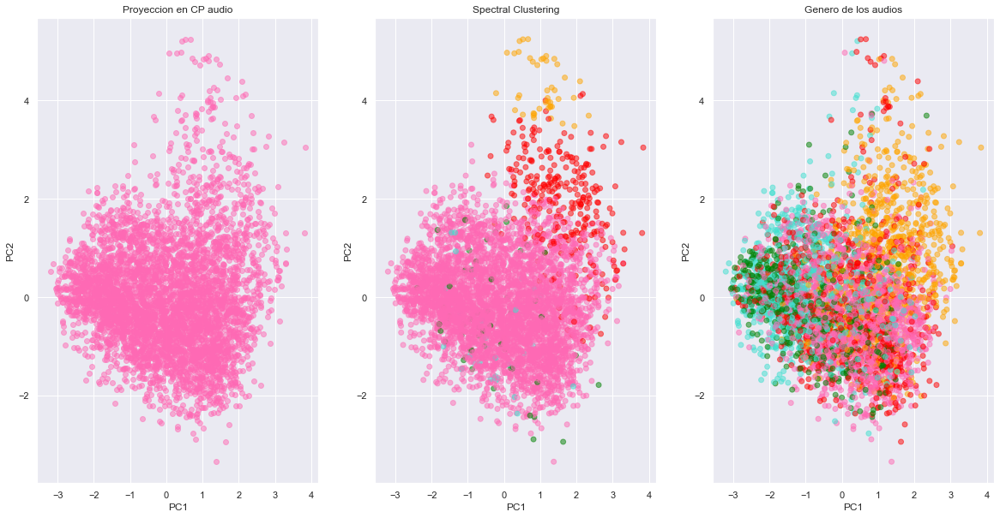

In [94]:
f, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3,figsize=(20,10))

l1=ax1.scatter(proj_audio['pc1'], proj_audio['pc2'],c='hotpink', alpha=0.5)
l2=ax2.scatter(proj_audio['pc1'], proj_audio['pc2'],c=[c_map[i] for i in clustering.labels_], alpha=0.5)
l3=ax3.scatter(proj_audio['pc1'], proj_audio['pc2'],c=[c_map[i] for i in genero_audio], alpha=0.5)
ax1.set_title('Proyeccion en CP audio')
ax2.set_title('Spectral Clustering')
ax3.set_title('Genero de los audios')
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC2')
ax3.set_xlabel('PC1')
ax3.set_ylabel('PC2')
plt.show()

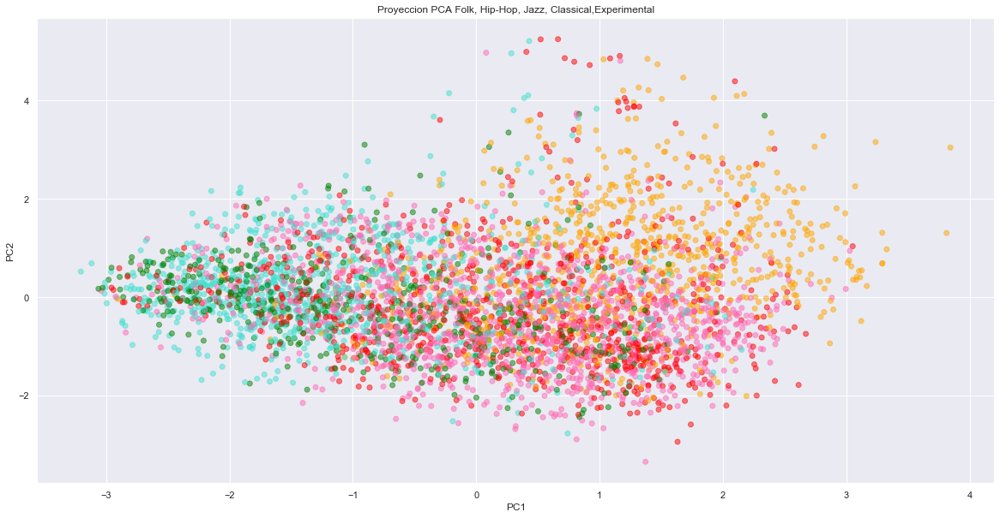

In [95]:
plt.figure(figsize=(20,10))
plt.scatter(proj_audio['pc1'], proj_audio['pc2'],c=[c_map[i] for i in genero_audio], alpha=0.5)
plt.title('Proyeccion PCA Folk, Hip-Hop, Jazz, Classical,Experimental')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

In [96]:
from sklearn.manifold import TSNE
import plotly.express as px

np.random.seed(0)
tsne = TSNE()
X_tsne = tsne.fit_transform(audios)

tsne_dataset = pd.DataFrame({'pc1': X_tsne[:, 0], 'pc2': X_tsne[:, 1], 'genero': genero_audio})

fig = px.scatter(tsne_dataset, x='pc1', y='pc2', color='genero', hover_data=['genero'])
fig.update_layout(
    autosize=False,
    width=800,
    height=800,
)
fig.show()

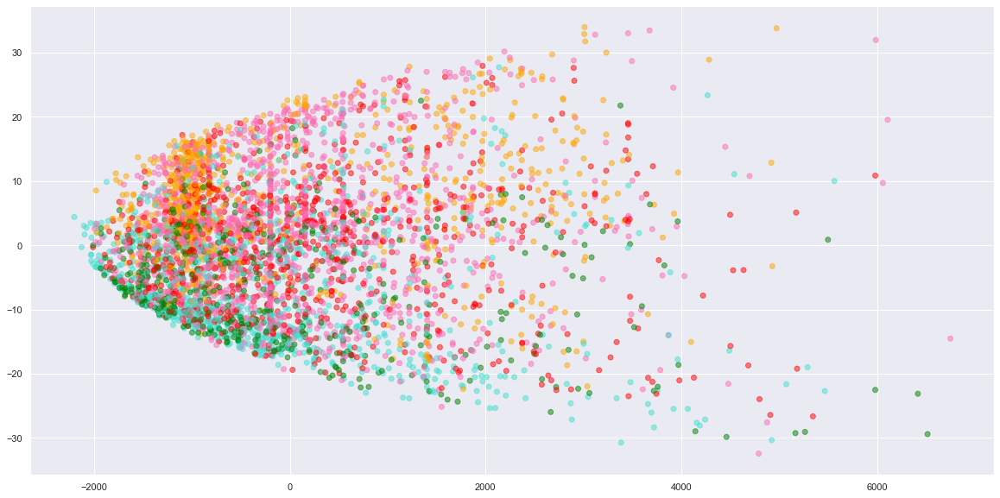

In [97]:
kpca = KernelPCA(n_components=3, kernel='poly',degree=2)
X3_kpca = kpca.fit_transform(audios)

proj_kpca = pd.DataFrame(X3_kpca,columns = ['pc1','pc2','pc3'])

plt.figure(figsize=(20,10))
plt.scatter(proj_kpca['pc1'], proj_kpca['pc2'],c=[c_map[i] for i in genero_audio], alpha=0.5)
plt.show()

## Análisis de Factores

In [98]:
from sklearn.decomposition import FactorAnalysis
transformer = FactorAnalysis(n_components=3, random_state=0)
X_transformed = transformer.fit_transform(X_audio)

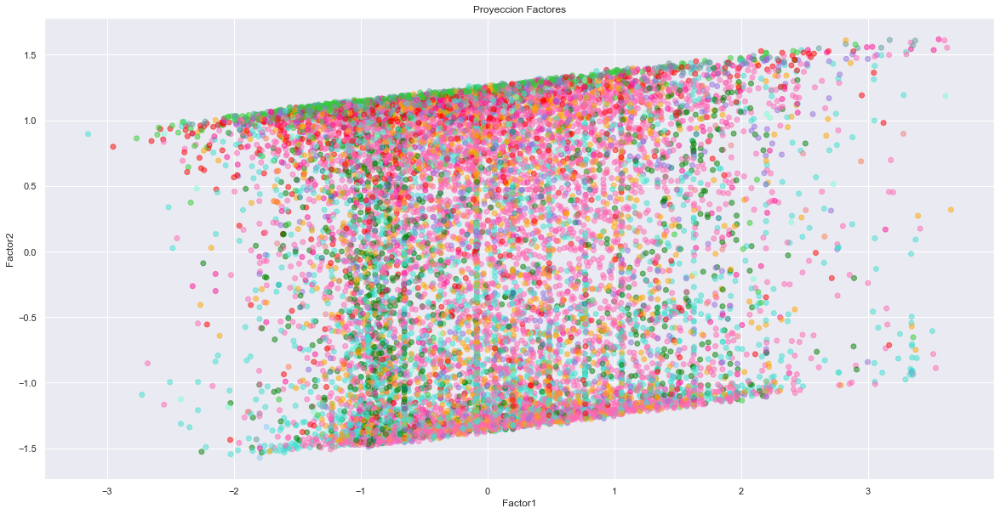

In [99]:
plt.figure(figsize=(20,10))
plt.scatter(X_transformed[:,0], X_transformed[:,1],c=[c_map[i] for i in num_audio_gen['genero']], alpha=0.5)
plt.title('Proyeccion Factores')
plt.xlabel('Factor1')
plt.ylabel('Factor2')
plt.show()

# Análisis de bailabilidad y energía

In [100]:
X_signal=num_signal.dropna()
num_signal_gen=num_signal_gen.dropna()

In [101]:
X_signal

,chromacens.kurtosis.01,chromacens.kurtosis.02,chromacens.kurtosis.03,chromacens.kurtosis.04,chromacens.kurtosis.05,chromacens.kurtosis.06,chromacens.kurtosis.07,chromacens.kurtosis.08,chromacens.kurtosis.09,chromacens.kurtosis.10,...,tonnetz.std.04,tonnetz.std.05,tonnetz.std.06,zcr.kurtosis.01,zcr.max.01,zcr.mean.01,zcr.median.01,zcr.min.01,zcr.skew.01,zcr.std.01
0,7.180653,5.230309,0.249321,1.347620,1.482478,0.531371,1.481593,2.691455,0.866868,1.341231,...,0.054125,0.012226,0.012111,5.758890,0.459473,0.085629,0.071289,0.000000,2.089872,0.061448
1,1.888963,0.760539,0.345297,2.295201,1.654031,0.067592,1.366848,1.054094,0.108103,0.619185,...,0.063831,0.014212,0.017740,2.824694,0.466309,0.084578,0.063965,0.000000,1.716724,0.069330
2,0.527563,-0.077654,-0.279610,0.685883,1.937570,0.880839,-0.923192,-0.927232,0.666617,1.038546,...,0.040730,0.012691,0.014759,6.808415,0.375000,0.053114,0.041504,0.000000,2.193303,0.044861
3,3.702245,-0.291193,2.196742,-0.234449,1.367364,0.998411,1.770694,1.604566,0.521217,1.982386,...,0.074358,0.017952,0.013921,21.434212,0.452148,0.077515,0.071777,0.000000,3.542325,0.040800
4,0.918445,0.674147,0.577818,1.281117,0.933746,0.078177,1.199204,-0.175223,0.925482,1.438509,...,0.058766,0.016322,0.015819,4.731087,0.419434,0.064370,0.050781,0.000000,1.806106,0.054623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13124,0.097877,-0.044097,0.583153,1.207580,-0.039224,-0.424114,-0.533979,0.985742,-0.155833,-0.644337,...,0.044130,0.017932,0.019123,11.869940,0.405273,0.049399,0.038086,0.000000,2.820800,0.042830
13125,-0.198880,-0.721772,-0.191884,-0.609692,-0.288568,0.429329,-0.492122,-0.024131,0.902539,0.483070,...,0.050790,0.019464,0.014612,4.255357,0.298828,0.040642,0.025391,0.000000,1.789954,0.040908
13126,0.044387,-0.235208,0.096385,0.322600,0.804817,1.456417,1.500891,1.254079,0.172433,0.140112,...,0.044322,0.018616,0.017603,7.419688,0.344727,0.047787,0.041504,0.001953,1.961021,0.035228
13127,-0.751019,2.669167,0.102222,-0.239587,0.213761,-0.606218,-0.397717,-0.541576,-0.865794,0.320008,...,0.097448,0.020286,0.020809,5.421509,0.283691,0.049346,0.040039,0.000000,1.949840,0.035900


In [102]:
for col in X_signal:
    if 'min' in col:
        #del X_signal[col]
        try:
            X_signal.drop(col, axis=1, inplace=True)
        except Exception:
            pass

In [103]:
X_signal.shape

(13129, 444)

In [104]:
dance=all_tracks['audio_features.danceability']
energy=all_tracks['audio_features.energy']

In [105]:
rango_d=dance.to_numpy().max()-dance.to_numpy().min()
tresh_d=rango_d/3

rango_e=energy.to_numpy().max()-energy.to_numpy().min()
tresh_e=rango_e/3

In [106]:
dance_c=[]
energy_c=[]
for i in range(dance.shape[0]):
    if dance[i]<=(dance.to_numpy().min()+tresh_d):
        dance_c.append(0)
    elif dance[i]<=(dance.to_numpy().min()+(2*tresh_d)):
        dance_c.append(1)
    else:
        dance_c.append(2)
        
for i in range(energy.shape[0]):
    if energy[i]<=(energy.to_numpy().min()+tresh_e):
        energy_c.append(0)
    elif energy[i]<=(energy.to_numpy().min()+(2*tresh_e)):
        energy_c.append(1)
    else:
        energy_c.append(2)

In [107]:
cat={0:'Baja',1:'Media',2:'Alta'}

In [108]:
from sklearn.model_selection import train_test_split

In [109]:
Xd_train, Xd_test, yd_train, yd_test = train_test_split(X_signal, dance_c, test_size=0.3, random_state=42)

In [110]:
Xe_train, Xe_test, ye_train, ye_test = train_test_split(X_signal, energy_c, test_size=0.3, random_state=42)

### LDA Y QDA

In [111]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
lda = LinearDiscriminantAnalysis()
lda.fit(Xd_train, yd_train)

C:\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning:

Variables are collinear.



LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

In [112]:
yd_lda=lda.predict(Xd_test)

In [113]:
print('Error de Entrenamiento Bailabilidad')
print(100*(1-lda.score(Xd_train, yd_train)))

Error de Entrenamiento Bailabilidad
31.153427638737764


In [114]:
print('Error de Prueba Bailabilidad')
print(100*(1-lda.score(Xd_test, yd_test)))

Error de Prueba Bailabilidad
34.80578827113481


In [115]:
lda.fit(Xe_train, ye_train)

C:\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning:

Variables are collinear.



LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

In [116]:
ye_lda=lda.predict(Xe_test)

In [117]:
print('Error de Entrenamiento Energia')
print(100*(1-lda.score(Xe_train, ye_train)))

Error de Entrenamiento Energia
22.11099020674646


In [118]:
print('Error de Prueba Energia')
print(100*(1-lda.score(Xe_test, ye_test)))

Error de Prueba Energia
24.19395785732419


In [119]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
qda = QuadraticDiscriminantAnalysis()
qda.fit(Xd_train,yd_train)

C:\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:693: UserWarning:

Variables are collinear



QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

In [120]:
yd_qda=qda.predict(Xd_test)

In [121]:
print('Error de Entrenamiento Bailabilidad')
print(100*(1-qda.score(Xd_train, yd_train)))

Error de Entrenamiento Bailabilidad
64.92927094668117


In [122]:
print('Error de Prueba Bailabilidad')
print(100*(1-qda.score(Xd_test, yd_test)))

Error de Prueba Bailabilidad
73.49581111957349


In [123]:
qda.fit(Xe_train,ye_train)
ye_qda=qda.predict(Xe_test)

C:\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:693: UserWarning:

Variables are collinear



In [124]:
print('Error de Entrenamiento Energia')
print(100*(1-qda.score(Xe_train, ye_train)))

Error de Entrenamiento Energia
49.65179542981502


In [125]:
print('Error de Prueba Energia')
print(100*(1-qda.score(Xe_test, ye_test)))

Error de Prueba Energia
56.638740797156636


### Multilogit

In [126]:
from sklearn.linear_model import LogisticRegression

multilogit = LogisticRegression(random_state=0,solver='liblinear',multi_class='auto').fit(Xd_train, yd_train)
yd_multilogit=multilogit.predict(Xd_test)

In [127]:
print('Error de Entrenamiento Bailabilidad')
print(100*(1-multilogit.score(Xd_train, yd_train)))

Error de Entrenamiento Bailabilidad
33.982589771490744


In [128]:
print('Error de Prueba Bailabilidad')
print(100*(1-multilogit.score(Xd_test, yd_test)))

Error de Prueba Bailabilidad
36.17669459253617


In [129]:
multilogit = LogisticRegression(random_state=0,solver='liblinear',multi_class='auto').fit(Xe_train, ye_train)
ye_multilogit=multilogit.predict(Xe_test)

In [130]:
print('Error de Entrenamiento Energia')
print(100*(1-multilogit.score(Xe_train, ye_train)))

Error de Entrenamiento Energia
22.13275299238302


In [131]:
print('Error de Prueba Energia')
print(100*(1-multilogit.score(Xe_test, ye_test)))

Error de Prueba Energia
24.752475247524753


### Multilayer Perceptron

In [132]:
from sklearn.neural_network import MLPClassifier

# The ith element represents the number of neurons in the ith hidden layer.
hls = [5,10]
# regularización
a = .1
mlp = MLPClassifier(solver='adam', hidden_layer_sizes=hls, random_state=0, alpha=a).fit(Xd_train, yd_train)

In [133]:
yd_mlp=mlp.predict(Xd_test)

In [134]:
print('Error de Entrenamiento Bailabilidad')
print(100*(1-mlp.score(Xd_train, yd_train)))

Error de Entrenamiento Bailabilidad
40.457018498367795


In [135]:
print('Error de Prueba Bailabilidad')
print(100*(1-mlp.score(Xd_test, yd_test)))

Error de Prueba Bailabilidad
41.2033511043412


In [136]:
mlp = MLPClassifier(solver='adam', hidden_layer_sizes=hls, random_state=0, alpha=a,max_iter=300).fit(Xe_train, ye_train)

In [137]:
ye_mlp=mlp.predict(Xe_test)

In [138]:
print('Error de Entrenamiento Energia')
print(100*(1-mlp.score(Xe_train, ye_train)))

Error de Entrenamiento Energia
23.41675734494015


In [139]:
print('Error de Prueba Energia')
print(100*(1-mlp.score(Xe_test, ye_test)))

Error de Prueba Energia
24.87941101802488


### Validación

In [140]:
no_tracks=pd.read_csv('my_all_tracks_No_genre_2019.csv',low_memory=False)

In [141]:
no_tracks.shape

(2231, 531)

In [142]:
no_tracks_signal=no_tracks.iloc[:,13:].copy()

In [143]:
no_tracks_signal.dropna()

,chromacens.kurtosis.01,chromacens.kurtosis.02,chromacens.kurtosis.03,chromacens.kurtosis.04,chromacens.kurtosis.05,chromacens.kurtosis.06,chromacens.kurtosis.07,chromacens.kurtosis.08,chromacens.kurtosis.09,chromacens.kurtosis.10,...,tonnetz.std.04,tonnetz.std.05,tonnetz.std.06,zcr.kurtosis.01,zcr.max.01,zcr.mean.01,zcr.median.01,zcr.min.01,zcr.skew.01,zcr.std.01
0,1.652691,0.997165,0.425771,0.756101,0.553108,0.438535,0.519851,0.193776,0.691729,1.418028,...,0.068595,0.019125,0.020730,7.149225,0.373535,0.054190,0.047363,0.000977,2.012555,0.034310
1,-0.471501,-0.978041,-1.162352,-1.125526,-0.695859,0.186768,-0.842401,-0.900934,-1.041274,-0.295380,...,0.085838,0.020440,0.021931,15.002182,0.403809,0.027115,0.010254,0.000000,3.635866,0.044702
2,-0.425933,-0.388079,0.984785,-0.337106,-0.257856,0.011318,-0.741799,-0.523876,-0.556418,-0.156306,...,0.146712,0.027935,0.026732,4.439726,0.263184,0.038922,0.033203,0.000000,1.760789,0.024103
3,0.285226,0.615295,0.493797,-0.081858,-1.209590,-0.464213,-0.975925,-1.102044,0.302474,-0.999052,...,0.078669,0.021029,0.020857,6.335954,0.359375,0.035697,0.020996,0.000000,2.244409,0.041179
4,0.663119,-0.042771,0.336489,0.142946,-0.127066,0.008267,-0.149104,0.464888,0.135276,0.027766,...,0.103090,0.018876,0.020073,11.862024,0.674805,0.060135,0.056641,0.001953,1.618118,0.032798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2226,-0.320727,-0.769925,-0.006675,-0.773327,-0.279549,-0.949405,-1.020597,-0.361368,0.049898,-0.520477,...,0.081517,0.023786,0.026558,4.498584,0.229004,0.038085,0.026855,0.000000,2.021808,0.032577
2227,-0.975041,-0.950634,-0.460796,0.362755,-0.290095,-0.155040,-0.491250,-0.280295,-0.127868,-0.689710,...,0.120448,0.022435,0.021819,84.470894,0.294922,0.022385,0.019531,0.000000,7.496816,0.015062
2228,0.602268,-0.069184,-0.358972,-0.809071,-0.781321,-0.362118,-0.678096,-0.580374,-0.477278,-0.407008,...,0.092976,0.020056,0.021712,32.669922,0.254395,0.031272,0.027832,0.000000,4.301869,0.016182
2229,-0.692236,0.726997,-0.337128,-0.086020,0.081877,0.214484,0.354116,-0.446788,-0.709969,-0.092190,...,0.082250,0.020585,0.020602,4.182501,0.399902,0.066817,0.057129,0.000000,1.682278,0.042578


In [144]:
for col in no_tracks_signal:
    if 'min' in col:
        #del X_signal[col]
        try:
            no_tracks_signal.drop(col, axis=1, inplace=True)
        except Exception:
            pass

In [145]:
no_tracks_signal.shape

(2231, 444)

In [146]:
lda.fit(Xd_train, yd_train)
vd_lda=lda.predict(no_tracks_signal)
lda.fit(Xe_train, ye_train)
ve_lda=lda.predict(no_tracks_signal)
qda.fit(Xd_train, yd_train)
vd_qda=qda.predict(no_tracks_signal)
qda.fit(Xe_train, ye_train)
ve_qda=qda.predict(no_tracks_signal)

C:\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning:

Variables are collinear.

C:\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:388: UserWarning:

Variables are collinear.

C:\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:693: UserWarning:

Variables are collinear

C:\Anaconda3\lib\site-packages\sklearn\discriminant_analysis.py:693: UserWarning:

Variables are collinear



In [147]:
multilogit = LogisticRegression(random_state=0,solver='liblinear',multi_class='auto').fit(Xd_train, yd_train)
vd_multi=multilogit.predict(no_tracks_signal)
multilogit = LogisticRegression(random_state=0,solver='liblinear',multi_class='auto').fit(Xe_train, ye_train)
ve_multi=multilogit.predict(no_tracks_signal)

In [148]:
mlp = MLPClassifier(solver='adam', hidden_layer_sizes=hls, random_state=0, alpha=a).fit(Xd_train, yd_train)
vd_mlp=mlp.predict(no_tracks_signal)
mlp = MLPClassifier(solver='adam', hidden_layer_sizes=hls, random_state=0, alpha=a,max_iter=300).fit(Xe_train, ye_train)
ve_mlp=mlp.predict(no_tracks_signal)

In [149]:
data={'Track ID':no_tracks['track_id'],'File':no_tracks['file'],'Bailabilidad LDA':vd_lda,
      'Bailabilidad QDA':vd_qda,'Bailabilidad Multilogit':vd_multi,'Bailabilidad MLP':vd_mlp,
      'Energia LDA':ve_lda,'Energia QDA':ve_qda, 'Energia Multilogit':ve_multi,'Energia MLP':ve_mlp}
ver_tracks=pd.DataFrame(data)

In [150]:
ver_tracks

,Track ID,File,Bailabilidad LDA,Bailabilidad QDA,Bailabilidad Multilogit,Bailabilidad MLP,Energia LDA,Energia QDA,Energia Multilogit,Energia MLP
0,613,fma_large/000/000613.mp3,0,2,1,1,2,2,2,2
1,1213,fma_large/001/001213.mp3,2,2,2,2,0,2,0,0
2,1216,fma_large/001/001216.mp3,0,2,1,1,0,2,0,0
3,1217,fma_large/001/001217.mp3,2,2,1,1,1,2,0,0
4,3276,fma_large/003/003276.mp3,1,2,1,1,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...
2226,155192,fma_large/155/155192.mp3,1,2,1,1,1,2,1,0
2227,155193,fma_large/155/155193.mp3,0,2,1,1,0,2,0,0
2228,155194,fma_large/155/155194.mp3,0,2,0,1,1,2,2,1
2229,155195,fma_large/155/155195.mp3,1,2,1,1,1,2,1,2


In [154]:
ver_tracks.dropna()

,Track ID,File,Bailabilidad LDA,Bailabilidad QDA,Bailabilidad Multilogit,Bailabilidad MLP,Energia LDA,Energia QDA,Energia Multilogit,Energia MLP
0,613,fma_large/000/000613.mp3,0,2,1,1,2,2,2,2
1,1213,fma_large/001/001213.mp3,2,2,2,2,0,2,0,0
2,1216,fma_large/001/001216.mp3,0,2,1,1,0,2,0,0
3,1217,fma_large/001/001217.mp3,2,2,1,1,1,2,0,0
4,3276,fma_large/003/003276.mp3,1,2,1,1,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...
2226,155192,fma_large/155/155192.mp3,1,2,1,1,1,2,1,0
2227,155193,fma_large/155/155193.mp3,0,2,1,1,0,2,0,0
2228,155194,fma_large/155/155194.mp3,0,2,0,1,1,2,2,1
2229,155195,fma_large/155/155195.mp3,1,2,1,1,1,2,1,2


In [158]:
ver_tracks.iloc[786,:]

Track ID                                      58372
File                       fma_large/058/058372.mp3
Bailabilidad LDA                                  1
Bailabilidad QDA                                  2
Bailabilidad Multilogit                           1
Bailabilidad MLP                                  1
Energia LDA                                       1
Energia QDA                                       2
Energia Multilogit                                1
Energia MLP                                       1
Name: 786, dtype: object